# Кто выбирает президентов
# Часть 3: Визуализация данных

Итак, мы собрали датасеты по подписчикам наших кандидатов - немного социально-демографических признаков и записи со стен. Посмотрим, что можно визуализировать по таким данным.

In [1]:
import pandas as pd              # Пакет для работы с таблицами
import numpy as np               # Пакет для работы с векторами и матрицами
import matplotlib.pyplot as plt  # Пакет для строительства графиков
import seaborn as sns            # Еще один пакет для графиков
import datetime                  # Пакет для работы с временными форматами
import pickle                    # Пакет для подгрузки данных специфического для питона формата

from dateutil.relativedelta import relativedelta # еще один пакет для работы с временем
from wordcloud import WordCloud  # Пакет для построения облаков слов

plt.style.use('ggplot')          # задаём красивый стиль для графиков matplotlib-а
%matplotlib inline

# Соц-дем

In [2]:
socdem_info = pd.read_csv('russia_20!8.csv', sep='\t', index_col=0)

/Users/dmitrys/anaconda/lib/python3.6/site-packages/numpy/lib/arraysetops.py:463: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [3]:
socdem_info.head()

,bdate,city,deactivated,first_name,home_town,id,last_name,sex,candidate
0,NaN,Санкт-Петербург,NaN,Николай,NaN,6,Дуров,2,Навальный
1,10.8,Łódź,NaN,Елисей,Санкт-Петербург,154,Замахов,2,Навальный
2,23.11.1981,Санкт-Петербург,NaN,Михаил,NaN,175,Захаренков,2,Навальный
3,NaN,NaN,banned,Галина,NaN,348,Румянцева,1,Навальный
4,3.5.1985,Санкт-Петербург,NaN,Сергей,Санкт-Петербург,374,Макеев,2,Навальный


In [4]:
socdem_info.tail()

,bdate,city,deactivated,first_name,home_town,id,last_name,sex,candidate
1068799,19.4.1970,NaN,NaN,Ол,NaN,471573939,Гус,2,Сурайкин
1068800,23.11.2001,NaN,NaN,Анонимус,NaN,472291073,Анонимный,2,Сурайкин
1068801,7.11.1953,Пермь,NaN,Viva-La,NaN,473095996,Resistance,2,Сурайкин
1068802,3.3.2003,Новосибирск,NaN,Роман,новосибирск,473736153,Ковалёв,2,Сурайкин
1068803,8.8.1978,Москва,NaN,Максим,NaN,474265309,Сурайкин,2,Сурайкин


In [5]:
print("Процент уникальных id {0:.2f}%".format(len(socdem_info.id.unique())/len(socdem_info)))

Процент уникальных id 0.98%


Для начала посмотрим, как пересекаются аудитории различных кандидатов

In [6]:
# составим список уникальных кандидатов (и не только)
candidates = socdem_info.candidate.unique()

# заодно посчитаем, сколько у каждого кандидата подписчиков
candidates_subscribers = socdem_info.groupby('candidate')['id'].count()

In [7]:
def getCommonUsersMatrix():
    """
        Возвращает квадратную матрицу (датафрейм) с числом подписчиков, пересекающихся у кандидатов
        отнормированную на общее число подписчиков кандидатов (попарно)
    """

    # инициализируем пустой датафрейм, где строки и столбцы - кандидаты
    common_users = pd.DataFrame(index=candidates, columns=candidates)
    
    # проходимся по всем кандидатам
    for candidate_1 in candidates:
        for candidate_2 in candidates:
            # сами с собой пересекаться не должны
            if candidate_1 == candidate_2:
                common_users.loc[candidate_1, candidate_2] = 0.
            else:
                # считаем число пользователей, одновременно состоящих в обеих группах
                users_intercection = len(
                    set(socdem_info.id[socdem_info.candidate==candidate_1]) &\
                    set(socdem_info.id[socdem_info.candidate==candidate_2])
                )
                # считаем число пользователей, состоящих в любой из групп (или в обеих одновременно)
                users_total = len(
                    set(socdem_info.id[socdem_info.candidate==candidate_1]) |\
                    set(socdem_info.id[socdem_info.candidate==candidate_2])
                )
                # заполняем матрицу процентом пересеченной аудиториии
                common_users.loc[candidate_1, candidate_2] = users_intercection/users_total
    # переводим всё во float
    common_users = common_users[common_users.columns].astype(float)
    
    return common_users

In [8]:
common_users = getCommonUsersMatrix()
common_users

,Навальный,Жириновский,Грудинин,Путин,Собчак,Бабурин,Явлинский,Титов,Сурайкин
Навальный,0.000000,0.006894,0.005462,0.003033,0.008907,0.000112,0.013701,0.004291,0.000277
Жириновский,0.006894,0.000000,0.005109,0.004806,0.004307,0.000372,0.009526,0.004848,0.000736
Грудинин,0.005462,0.005109,0.000000,0.000751,0.004065,0.001013,0.005367,0.003717,0.001878
Путин,0.003033,0.004806,0.000751,0.000000,0.000941,0.000054,0.000435,0.000863,0.000104
Собчак,0.008907,0.004307,0.004065,0.000941,0.000000,0.000511,0.012455,0.003495,0.000272
Бабурин,0.000112,0.000372,0.001013,0.000054,0.000511,0.000000,0.000928,0.000943,0.000152
Явлинский,0.013701,0.009526,0.005367,0.000435,0.012455,0.000928,0.000000,0.016963,0.002244
Титов,0.004291,0.004848,0.003717,0.000863,0.003495,0.000943,0.016963,0.000000,0.001085
Сурайкин,0.000277,0.000736,0.001878,0.000104,0.000272,0.000152,0.002244,0.001085,0.000000


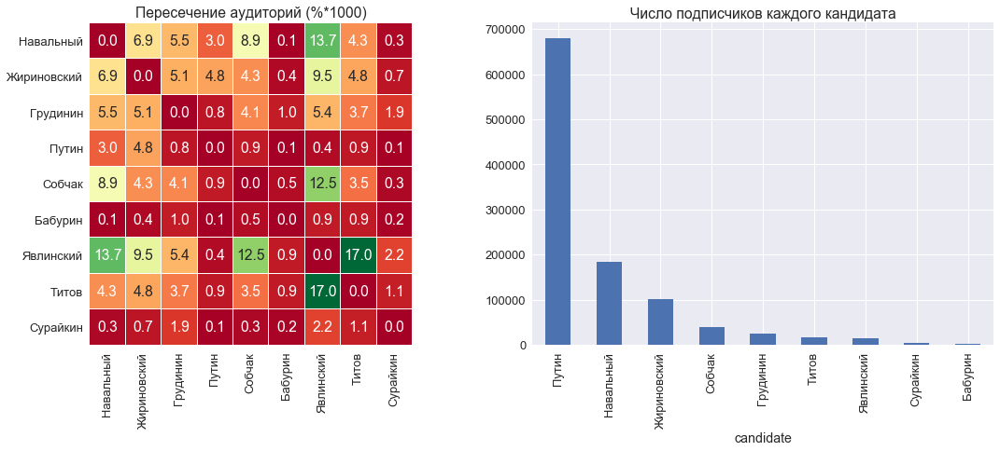

In [21]:
sns.set(font_scale=1.3)
plt.subplots(figsize=(16, 7))
plt.subplot(1,2,1)
plt.title('Пересечение аудиторий (%*1000)')
sns.heatmap(common_users*1000, square=True,
            annot=True, fmt=".1f", linewidths=0.1, cmap="RdYlGn", cbar=False)

plt.subplot(1,2,2)
plt.title('Число подписчиков каждого кандидата')
candidates_subscribers.sort_values(ascending=False).plot(kind='bar')
plt.tight_layout()
plt.show()

# Женщины и мужчины 

Из документаци: 

пол пользователя, возможные значения:
- 1 — женский;
- 2 — мужской;
- 0 — пол не указан.

In [10]:
socdem_info.sex.value_counts()

2    743047
1    325320
0       436
3         1
Name: sex, dtype: int64

Третий пол?

In [11]:
socdem_info[socdem_info.sex==3]

,bdate,city,deactivated,first_name,home_town,id,last_name,sex,candidate
10729,1234567890.5,Nagoya,NaN,Jacoby,\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\nМ\nО\nС\nК\nВ\...,3953968,Shaddix,3,Навальный


<img align="center" src="pictures/3gender.png" height="600" width="600">

Всё-таки посмотрим, как распределено соотношение мужчин и женщин среди подписчиков наших кандидатов.

In [12]:
# при помощи магии groupby посчитаем для каждого кандидата число женщин и мужчин
men_women = socdem_info[socdem_info.sex.isin([1, 2])].groupby(['candidate', 'sex'])['id'].count()
men_women = men_women.reset_index().set_index('candidate')

# а также в среднем по больнице
mean_proportion = socdem_info[socdem_info.sex.isin([1, 2])].groupby('sex')['id'].count()
mean_proportion = mean_proportion/sum(mean_proportion)

# а теперь отнормируем это число на общее число подписчиков кандидата
men_women['id'] = men_women[['id']]/pd.DataFrame(men_women.groupby(['candidate'])['id'].sum())

In [13]:
men_women

,sex,id
candidate,,
Бабурин,1,0.429191
Бабурин,2,0.570809
Грудинин,1,0.264442
Грудинин,2,0.735558
Жириновский,1,0.261025
Жириновский,2,0.738975
Навальный,1,0.261000
Навальный,2,0.739000
Путин,1,0.300929


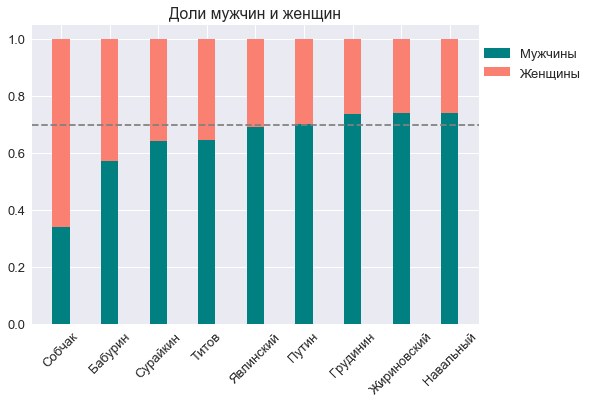

In [14]:
# выделяем вектора для мужчин, женщин и кандидатов (no pun intended)
men = men_women[men_women.sex==2]['id'].values
women = men_women[men_women.sex==1]['id'].values
candidates = list(men_women.index.unique())

# отсортируем по возрастанию доли мужчин
combined = list(zip(men, women, candidates))
men, women, candidates = zip(*sorted(combined))

ind = np.arange(len(candidates))   
width = 0.35        

# строим красивые столбцы
p1 = plt.bar(ind, men, width, color='teal')
p2 = plt.bar(ind, women, width, bottom=men, color='salmon')

plt.title('Доли мужчин и женщин')
plt.xticks(ind, candidates, rotation=45)
plt.yticks(np.linspace(0, 1, 6))
plt.axhline(mean_proportion[2], ls='--', color='grey')
plt.legend((p1[0], p2[0]), ('Мужчины', 'Женщины'), loc=(1, 0.8))

plt.show()

# Возраст

In [15]:
# возьмем интересующие нас столбцы и очистим их от пропущенных значений
birthdays = socdem_info[['bdate', 'candidate']].copy()
birthdays = birthdays.dropna()

In [16]:
def dateConverter(date):
    """
        Пытается сконвертировать дату в datetime
    """
    try:
        return pd.to_datetime(date)
    except:
        return np.NaN

# lambda-функция для рассчета лет, прошедших с момента рождения
year_counter = lambda bdate: relativedelta(pd.to_datetime('2018-04-01'), bdate).years

In [17]:
# конвертим и снова чистим даты
birthdays.bdate = birthdays.bdate.apply(dateConverter)
birthdays = birthdays.dropna()
# рассчитываем возраст
birthdays['age'] = birthdays.bdate.apply(year_counter)

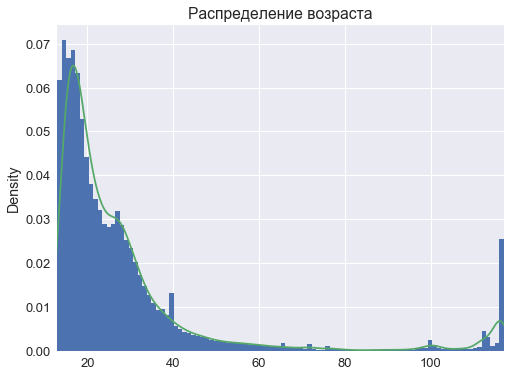

In [18]:
plt.figure(figsize=(8, 6))
birthdays.age.hist(bins=100, normed=True)
birthdays.age.plot(kind='kde')
plt.xlim(xmin=birthdays.age.min(), xmax=birthdays.age.max())
plt.title("Распределение возраста")
plt.show()

In [19]:
birthdays.head()

,bdate,candidate,age
2,1981-11-23,Навальный,36
4,1985-03-05,Навальный,33
5,1988-12-26,Навальный,29
8,1984-03-10,Навальный,34
10,1988-08-11,Навальный,29


Средний возраст подписчиков кандидатов

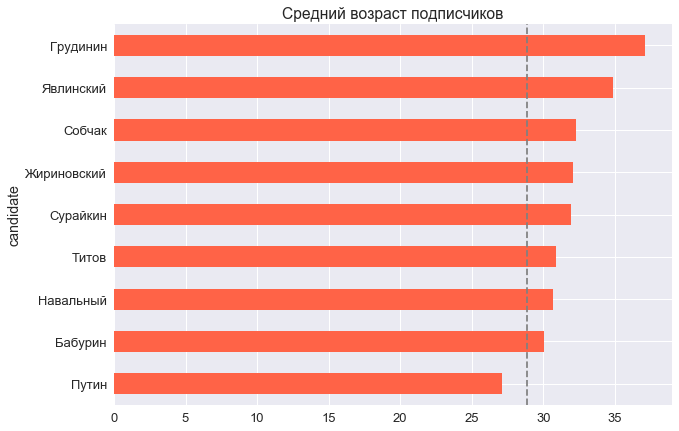

In [20]:
average_age = birthdays.groupby('candidate')['age'].mean()

plt.figure(figsize=(10, 7))
plt.title('Средний возраст подписчиков')
rects = average_age.sort_values().plot(kind='barh', color='tomato')
plt.axvline(birthdays.age.mean(), ls='--', color='grey')
plt.show()

# Облака

In [4]:
# подгружаем файл чанками, чтобы не падало ядро из-за перегрузки оперативной памяти
for chunck_df in pd.read_csv('data_text_lemm.csv', sep=';', index_col=0, chunksize=1000):
    lemmatized_posts = lemmatized_posts.append(chunck_df, ignore_index=True)

In [5]:
lemmatized_posts.shape

(71544, 2)

In [6]:
lemmatized_posts.head()

,candidat_name,lemm_text
0,Putin,"['друг', 'встречаться', 'сегодня', '19', '00',..."
1,Putin,"['это', 'вещь', 'собрать', 'осадный', 'мортира..."
2,Putin,"['конкурс', '15', 'рандомный', 'ключ', 'steam'..."
3,Putin,"['сметь', 'думать', 'мочь', 'выдержать', 'эрне..."
4,Putin,"['художник', 'ринат', 'волигамси', 'большой', ..."


In [17]:
def getFullText(candidate):
    """
        Возвращает строку, содержащую склеенные посты по данному кандидату
    """

    cloud = ''
    for i in lemmatized_posts[lemmatized_posts.candidat_name==candidate].lemm_text:
        posts = i[1:-1].split()
        posts = [word for word in posts if len(word)>5]
        cloud += (' '+" ".join(posts))
        
    return cloud

In [18]:
cloud_putin = getFullText('Putin')

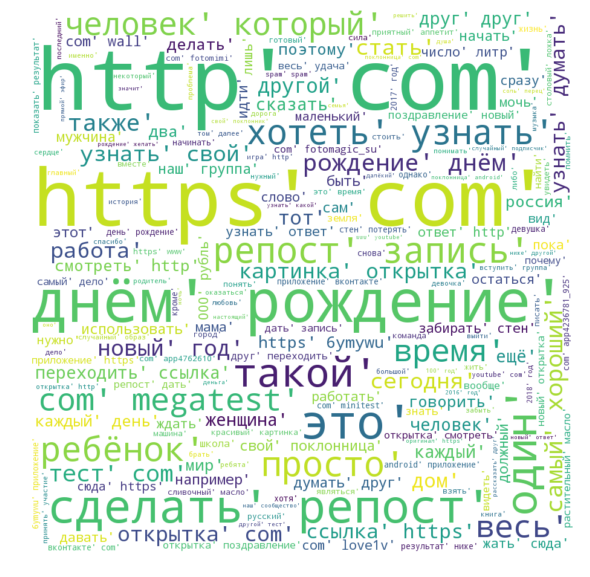

In [20]:
wordcloud = WordCloud(background_color="white", max_words=200, width=900, height=900)
wordcloud = wordcloud.generate(cloud_putin)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear',)
plt.axis("off");

# Топики

Визуализируем все 30 топиков, построенных по всему корпусу текста

In [22]:
with open('lda_30_topics', 'rb') as f:
    lda_30_topics = pickle.load(f)

In [159]:
def getTopicWords(topic_number, scaling=10000):
    """
        Возвращает склеенные в текст слова топика, отмасштабированные по вероятности
    """
    # забираем слова и вероятности из топиков
    topic = lda_30_topics[topic_number][1]
    # инициализируем пустой лист для хранения текста
    topic_multiplied = []
    # проходимся по всем словам топика
    for word, prob in topic:
        # повторяем слово N раз, где N = int(word_probability * scaling)
        topic_multiplied.append([word] * int(prob*scaling))
    
    # склеиваем все слова в один текст
    topic_multiplied = sum(topic_multiplied, [])
    topic_multiplied = ",".join(topic_multiplied)
    
    return topic_multiplied

In [67]:
def plotWordCloud(topic_number):
    """
        Строит визуализацию слов на основе текстов топиков
    """
    # получаем текст топика
    text = getTopicWords(topic_number)
    # строим облако слов
    wordcloud = WordCloud(background_color="white", max_words=100, width=900, height=900, collocations=False)
    wordcloud = wordcloud.generate(text)
    plt.figure(figsize=(15, 10))
    plt.title("Топик номер {}".format(topic_number))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");

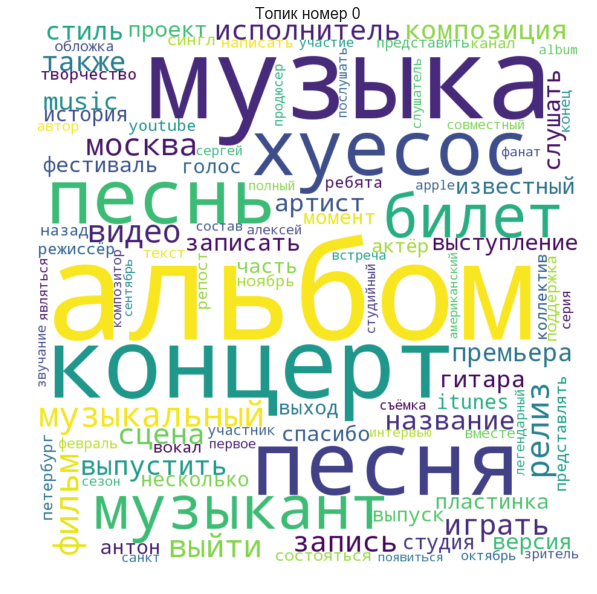

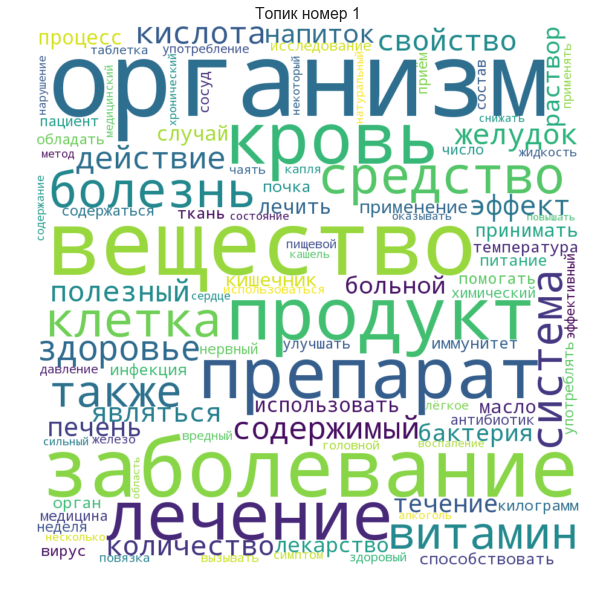

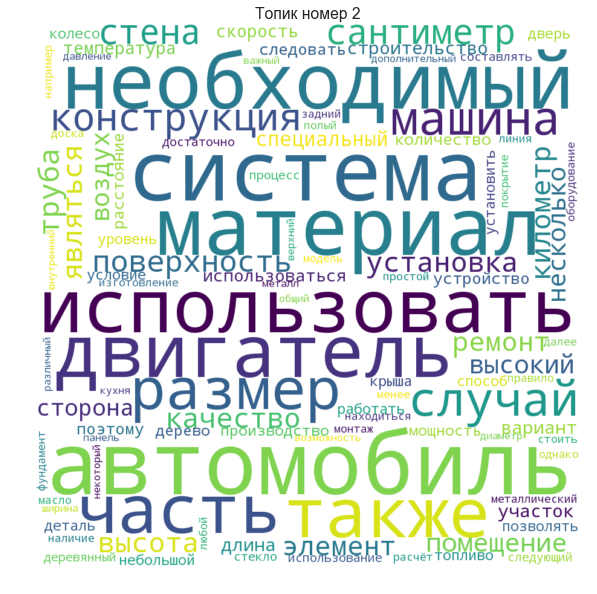

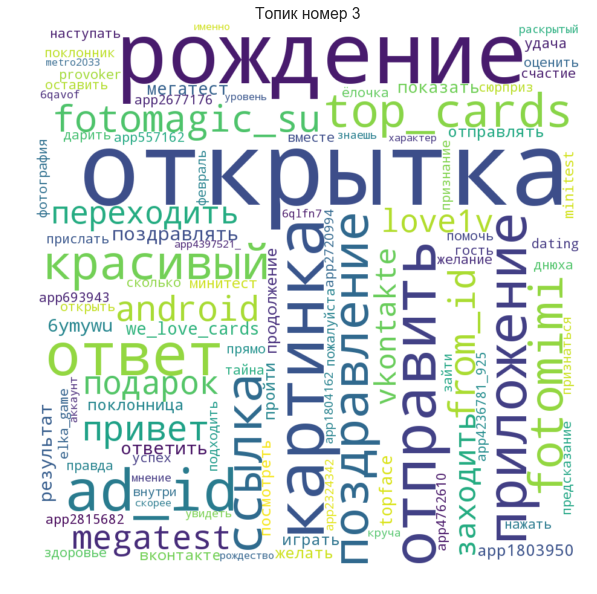

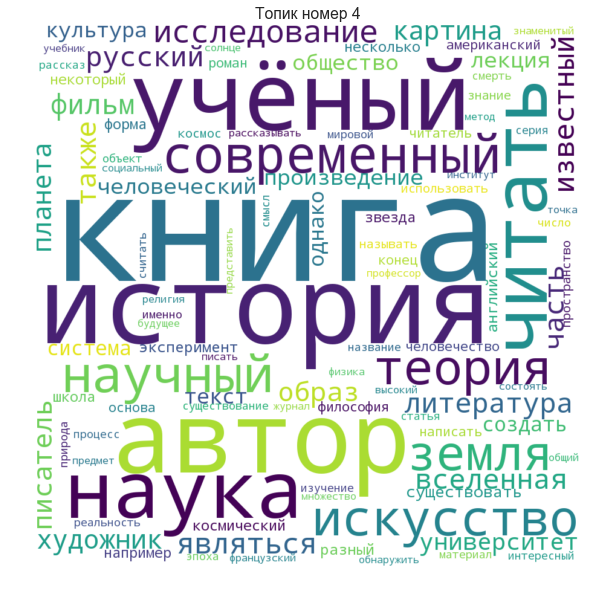

In [74]:
for i in range(5):
    plotWordCloud(topic_number=i)

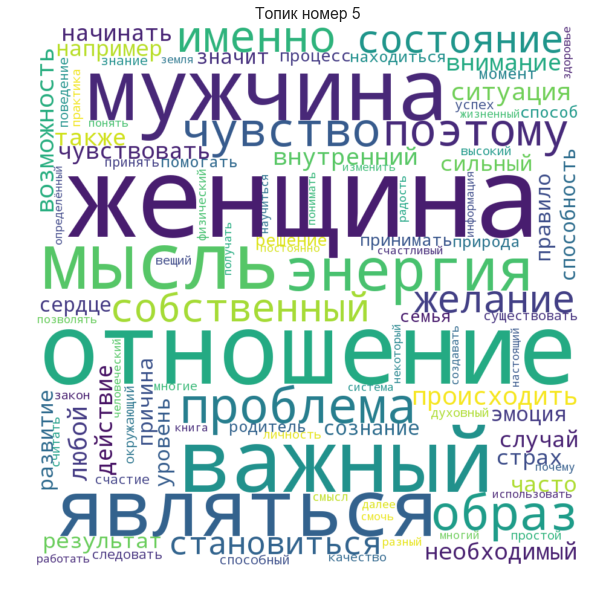

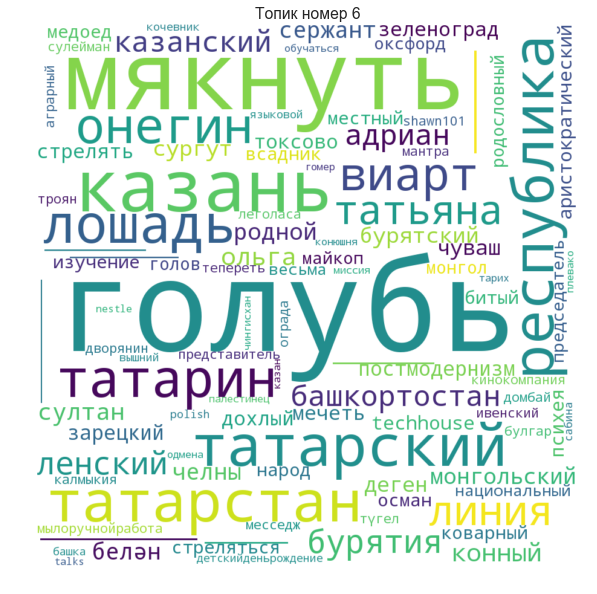

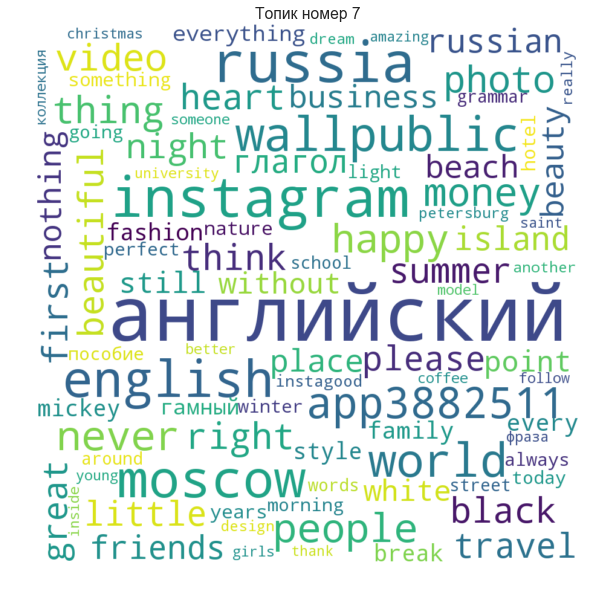

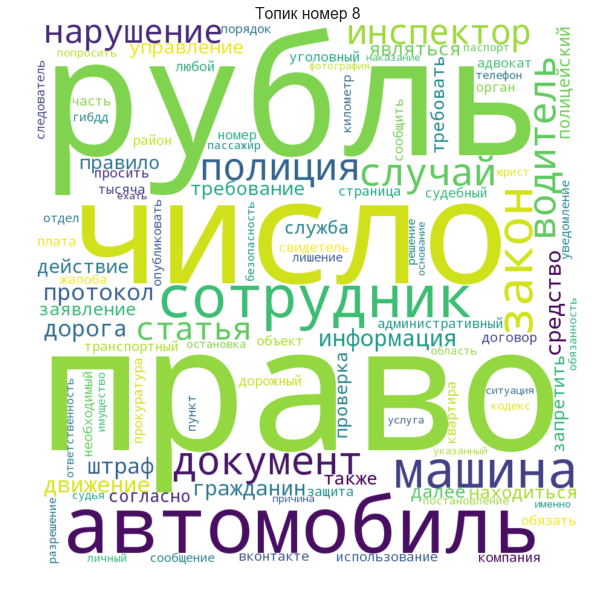

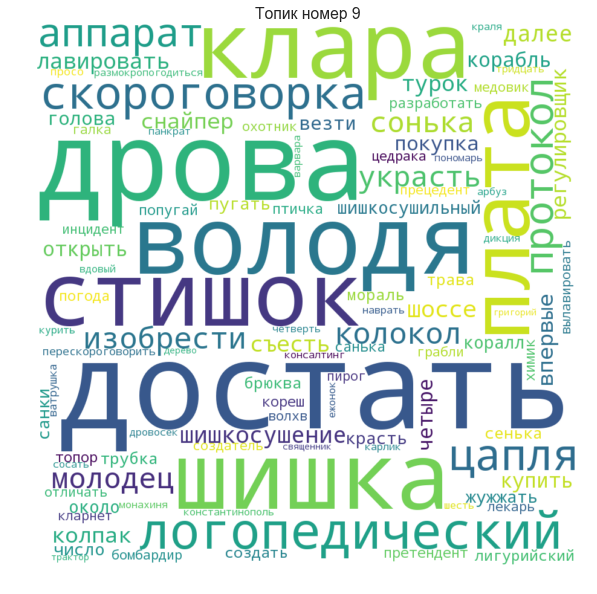

In [75]:
for i in range(5, 10):
    plotWordCloud(topic_number=i)

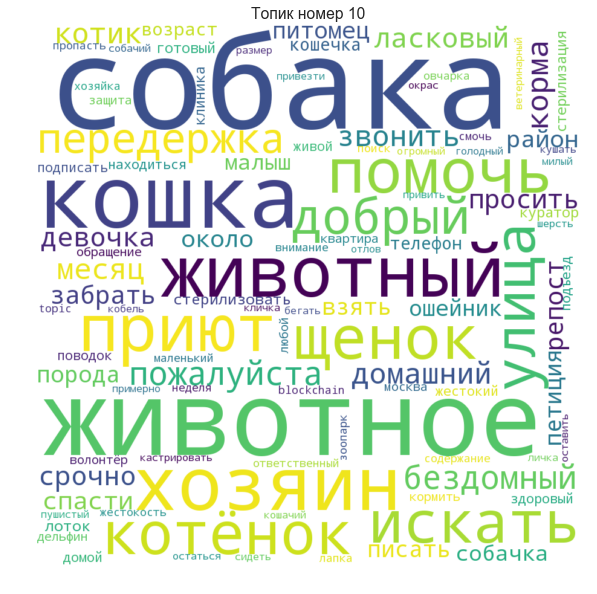

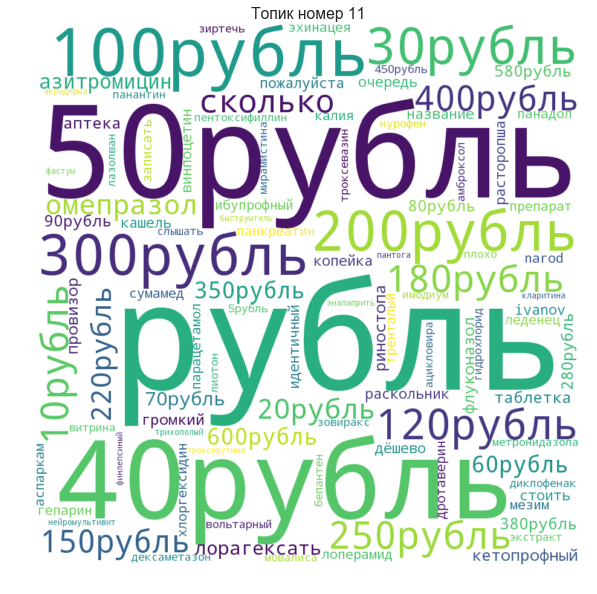

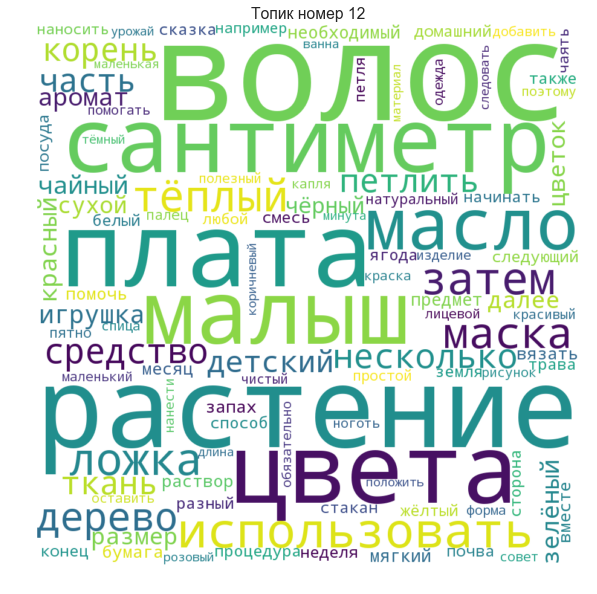

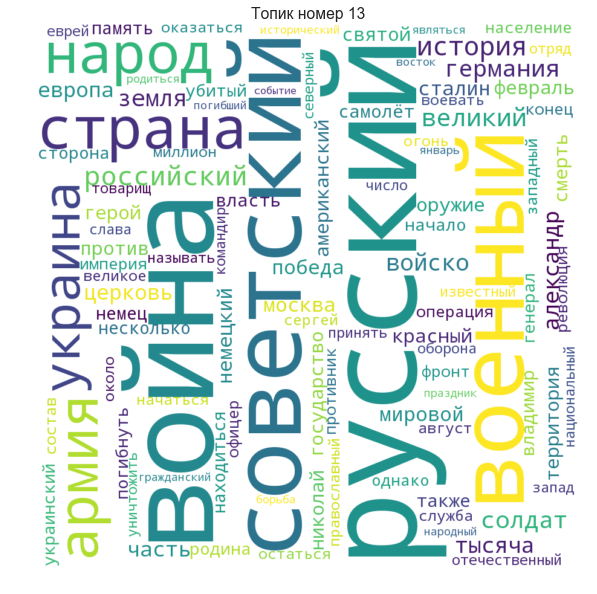

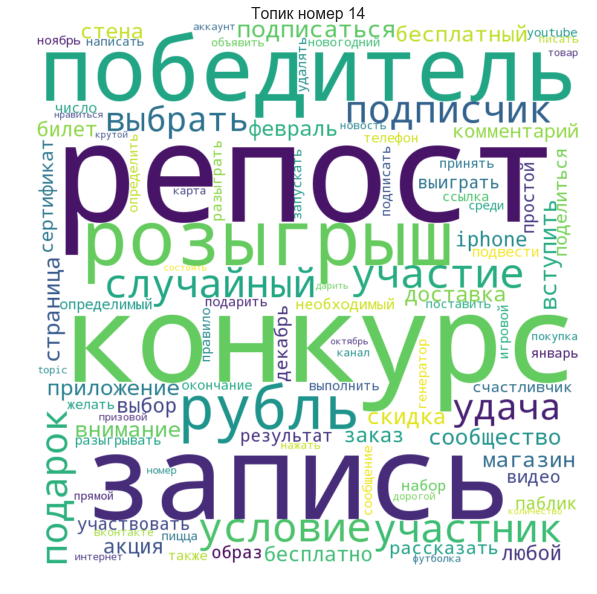

In [88]:
for i in range(10, 15):
    plotWordCloud(topic_number=i)

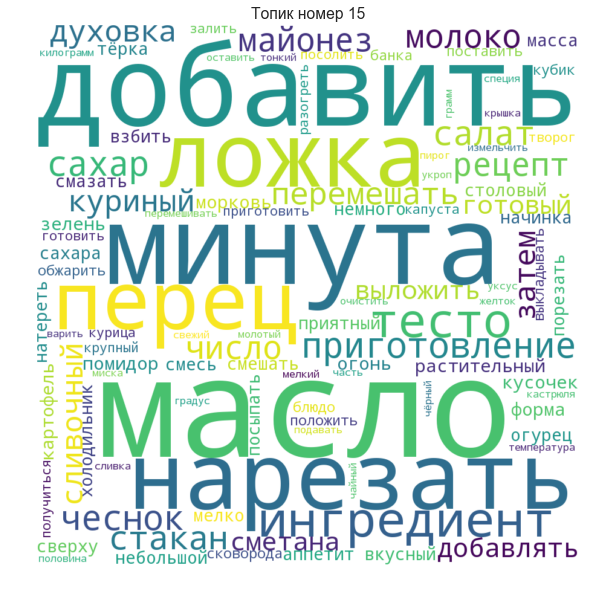

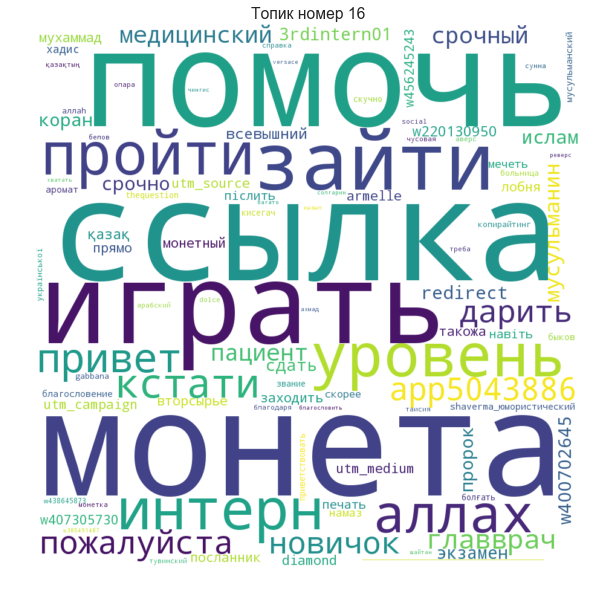

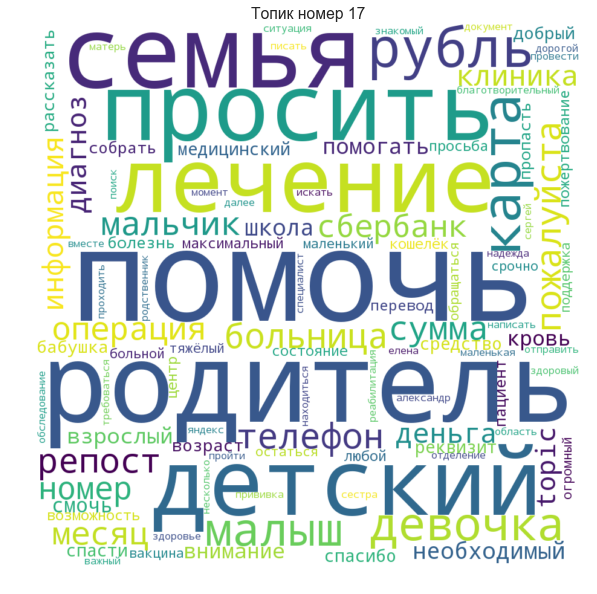

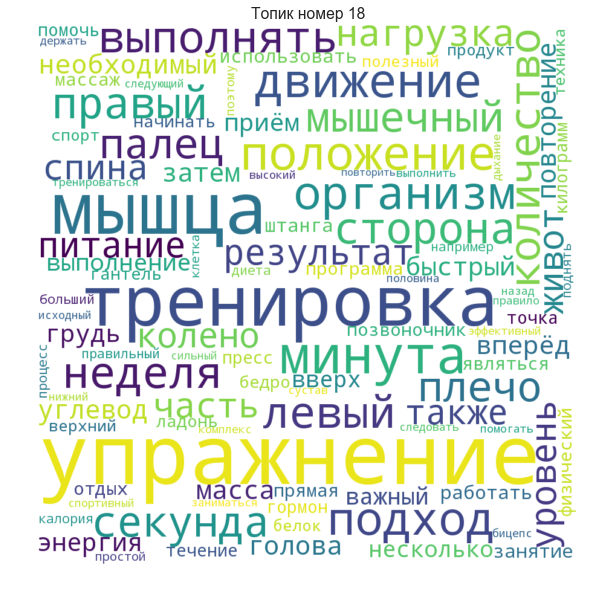

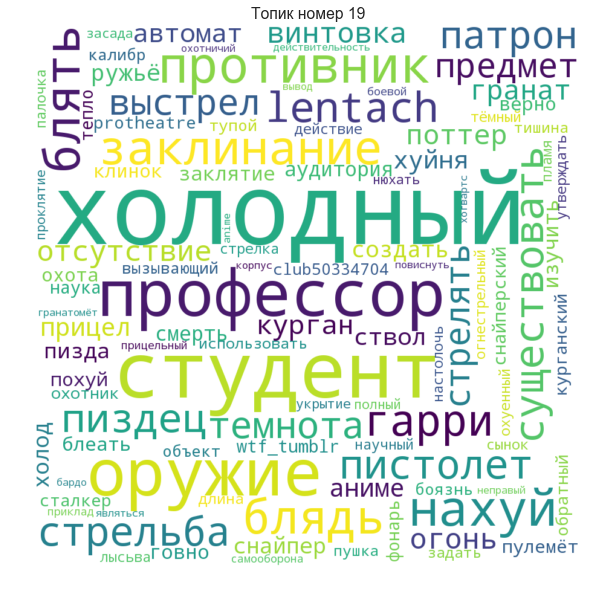

In [76]:
for i in range(15, 20):
    plotWordCloud(topic_number=i)

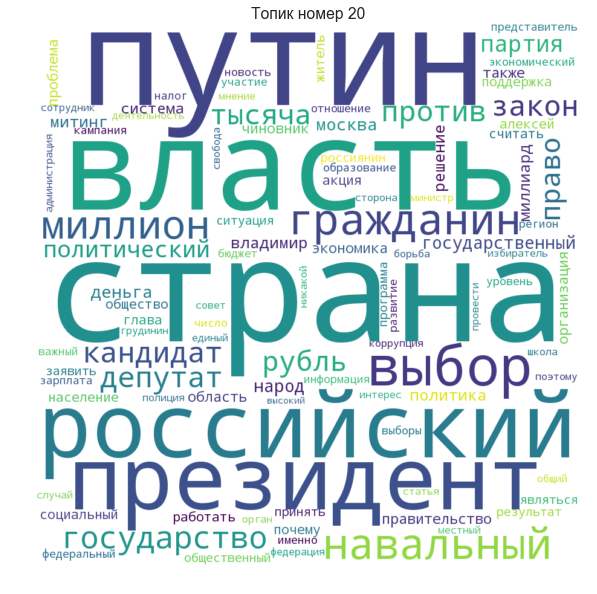

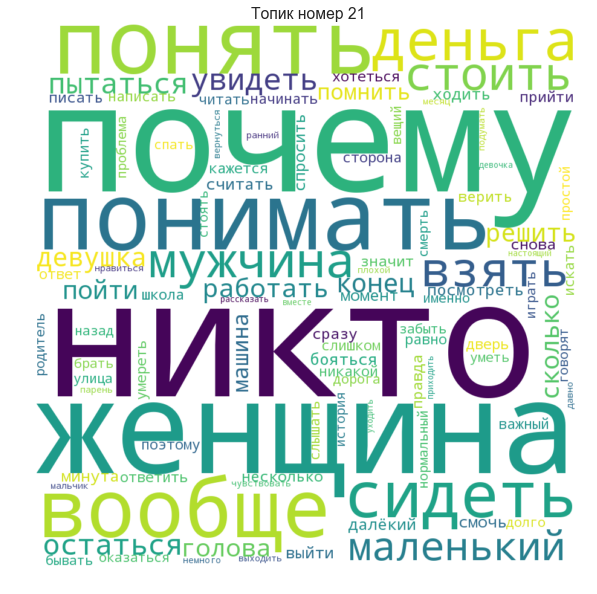

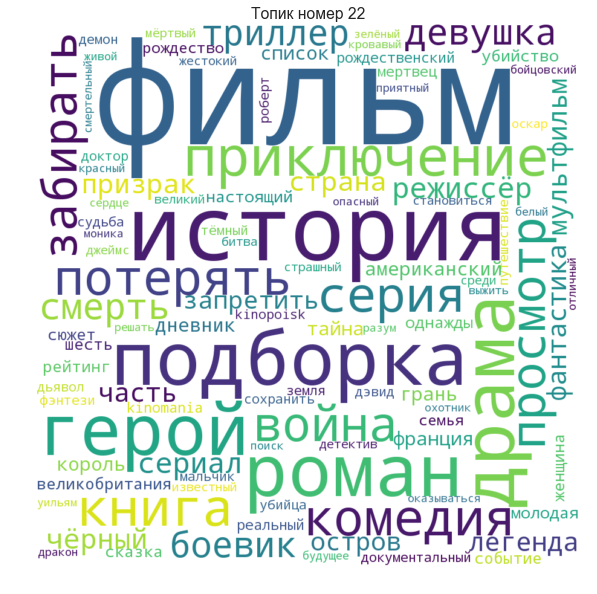

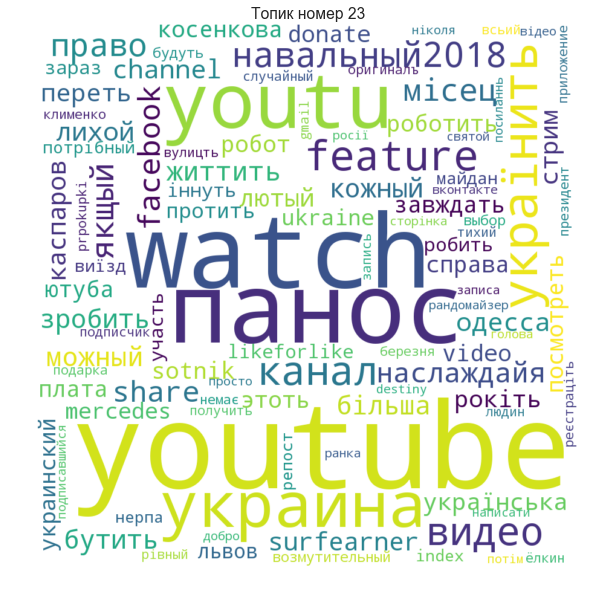

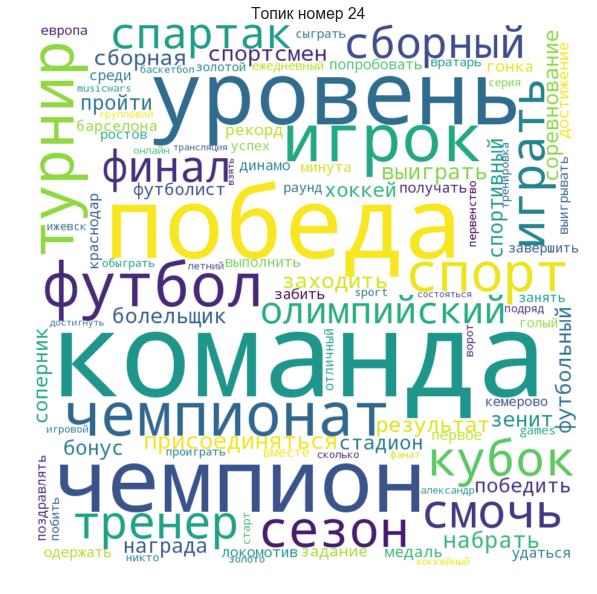

In [77]:
for i in range(20, 25):
    plotWordCloud(topic_number=i)

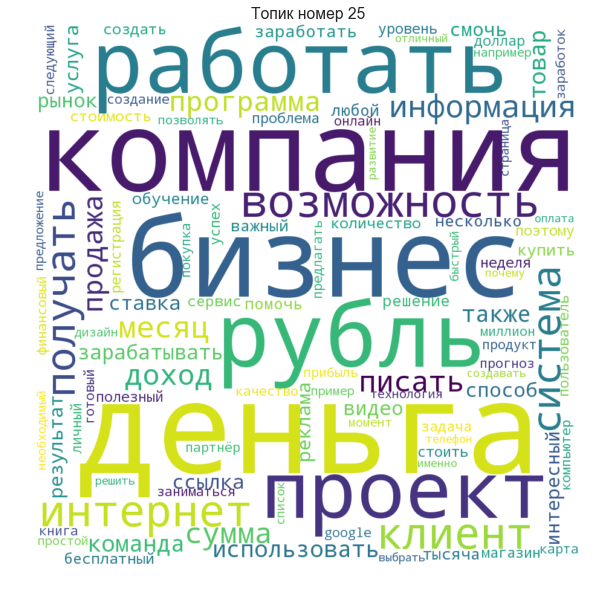

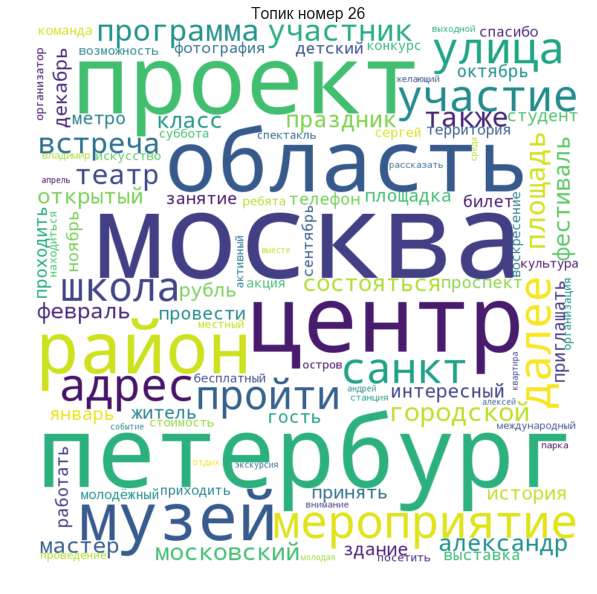

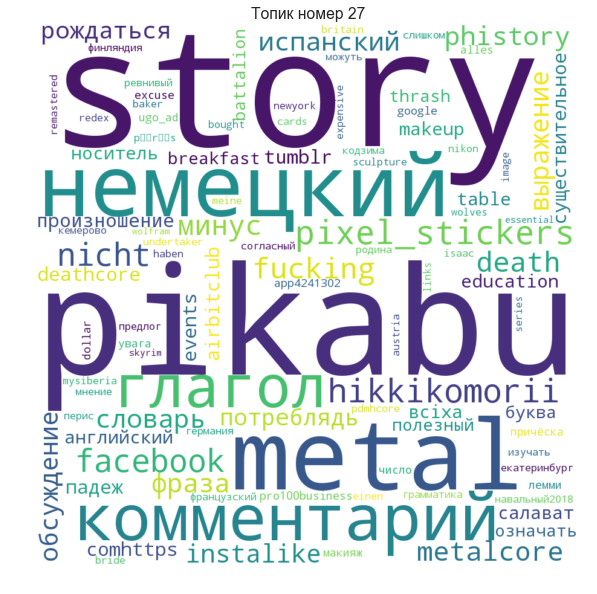

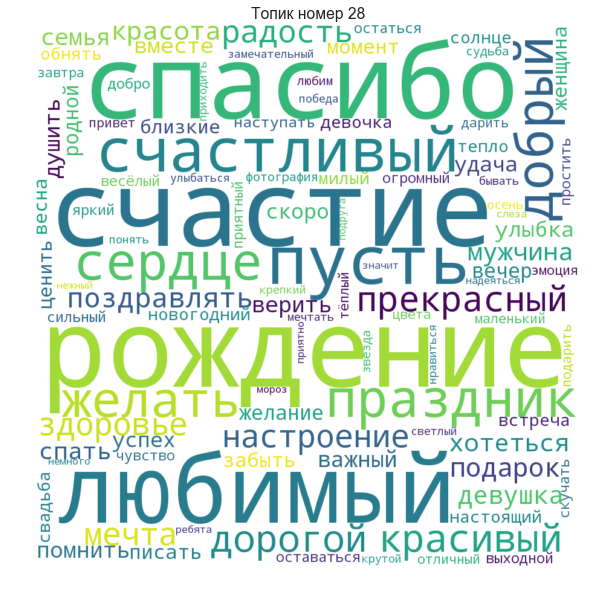

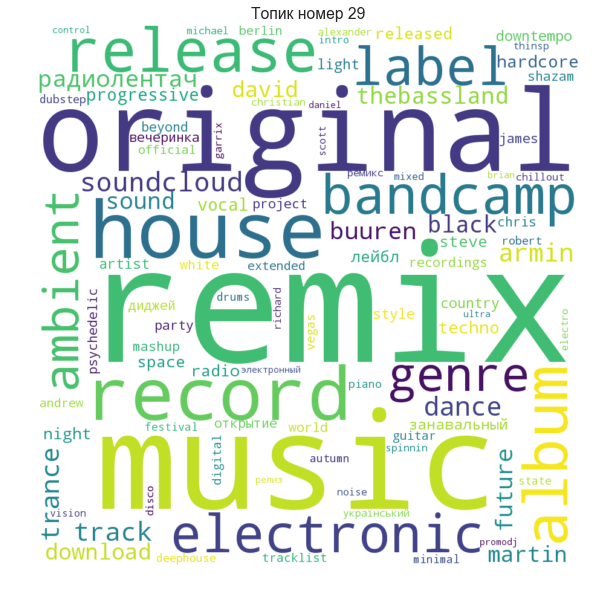

In [78]:
for i in range(25, 30):
    plotWordCloud(topic_number=i)

А теперь, зная общие распределения тем и содержания слов в них, построим распределения слов для "средних" подписчиков кандидатов

In [79]:
with open('candidate_themes', 'rb') as f:
    candidate_themes = pickle.load(f)

In [134]:
def getCandidateTopicText(candidate_name):
    """
        Возвращает склеенные в текст слова кандидата, отмасштабированные по вероятности топиков
    """
    candidate_text = ""
    # итерируем по всем топика
    for topic_number in range(30):
        # выкидываем самые большие топики
        if topic_number not in [21, 28]:
            # берем вероятность топика для кандидата
            topic_probability = candidate_themes[candidate_name][topic_number][1]
            # и ткущий топик
            topic = lda_30_topics[topic_number][1]
            # здесь будут храниться слова топика, взвешенные по вероятности топика
            weighted_topic = []
            # взвешиваем по вероятности слова и вероятности топика
            for word, probability in topic:
                weighted_topic.append([word] * int(prob*topic_probability*1000000))
            # склеиваем слова в один массив текста
            weighted_topic = sum(weighted_topic, [])
            candidate_text += ",".join(weighted_topic)
        
    return candidate_text

In [144]:
def plotCandidateWordCloud(candidate_name):
    """
        Строит визуализацию слов на основе текстов кандидатов
    """
    # получаем текст для кандидата
    candidate_text = getCandidateTopicText(candidate_name)
    # строим облако слов
    wordcloud = WordCloud(background_color="white", max_words=100,
                          width=900, height=900, collocations=False)
    wordcloud = wordcloud.generate(candidate_text)
    plt.figure(figsize=(15, 10))
    plt.title("Candidate {}".format(candidate_name))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");

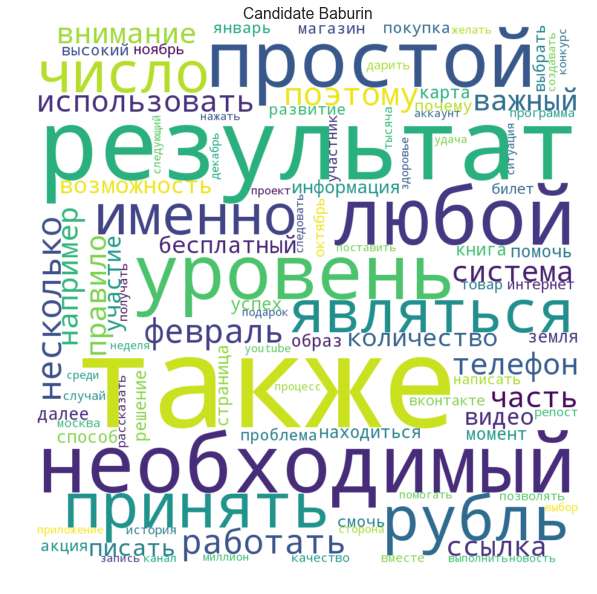

In [139]:
plotCandidateWordCloud('Baburin')

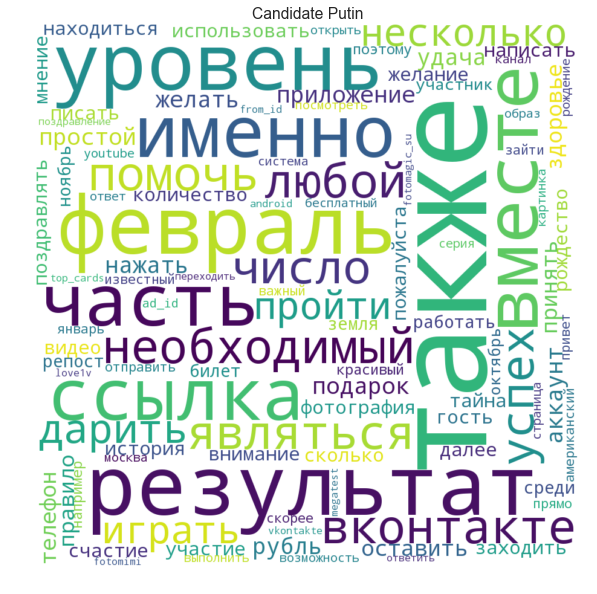

In [146]:
plotCandidateWordCloud('Putin')

In [140]:
from PIL import Image

In [160]:
full_text = ""
for topic_number in range(30):
    full_text += getTopicWords(topic_number, scaling=20000)

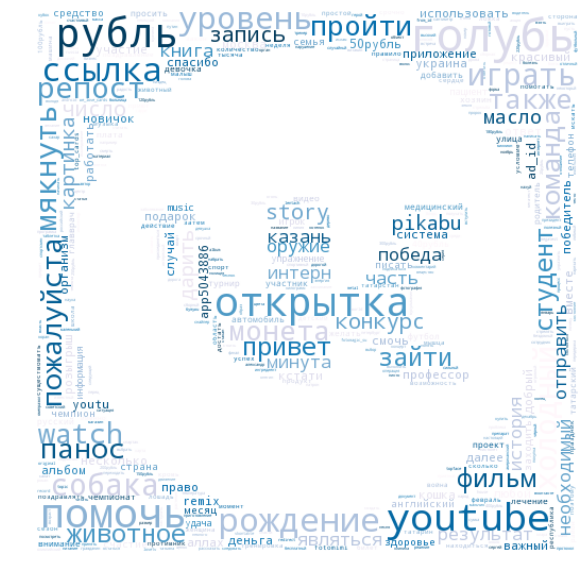

In [168]:
pic = np.array(Image.open("vkontakte_PNG19.png"))

# строим облако слов
wordcloud = WordCloud(background_color="white", max_words=20000, 
                      mask=pic, colormap='PuBu',
                      collocations=False)
wordcloud = wordcloud.generate(full_text)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off");